In [1]:
import pandas as pd
import numpy as np
import yfinance as yf
import plotly.express as px
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from prophet import Prophet
import seaborn as sns

C:\Users\kalra\Yelp Analysis\yelp_analysis\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import warnings
warnings.filterwarnings('ignore')

## **DOWNLOADING DATA**

In [3]:
companies = {
    "Reliance": "RELIANCE.NS",
    "TCS": "TCS.NS",
    "HDFC": "HDFCBANK.NS",
    "Airtel": "BHARTIARTL.NS",
    "SBI": "SBIN.NS",
    "Tata Motors": "TATAMOTORS.NS",
    "Infosys": "INFY.NS"
}

largest_comp = pd.DataFrame()

for name, ticker in companies.items():
    current_df = yf.download(ticker, start='2020-01-01', end='2025-04-10', group_by='ticker')

    # Droping MultiIndex
    if isinstance(current_df.columns, pd.MultiIndex):
        current_df.columns = current_df.columns.droplevel(0)

    current_df.reset_index(inplace=True)
    current_df.rename(columns={
        'Date': 'date',
        'Open': 'open',
        'High': 'high',
        'Low': 'low',
        'Close': 'close',
        'Volume': 'volume'
    }, inplace=True)
    
    current_df['Name'] = name
    largest_comp = pd.concat([largest_comp, current_df], ignore_index=True)
    largest_comp.columns.name = None
largest_comp

YF.download() has changed argument auto_adjust default to True


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


,date,open,high,low,close,volume,Name
0,2020-01-01,693.978516,698.138733,688.263977,690.138306,14004468,Reliance
1,2020-01-02,691.235535,704.470520,691.235535,701.887512,17710316,Reliance
2,2020-01-03,700.835999,704.790527,696.264343,702.733276,20984698,Reliance
3,2020-01-06,694.892883,698.504456,684.835205,686.435303,24519177,Reliance
4,2020-01-07,694.435669,701.521790,691.921265,696.995850,16683622,Reliance
...,...,...,...,...,...,...,...
9144,2025-04-03,1534.650024,1534.650024,1485.050049,1496.500000,10459504,Infosys
9145,2025-04-04,1460.500000,1472.000000,1448.000000,1451.650024,9590254,Infosys
9146,2025-04-07,1352.000000,1405.900024,1307.000000,1396.750000,21715252,Infosys
9147,2025-04-08,1431.000000,1456.500000,1415.000000,1428.800049,12805001,Infosys


In [4]:
largest_comp['date']=pd.to_datetime(largest_comp['date'])

In [5]:
largest_comp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9149 entries, 0 to 9148
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    9149 non-null   datetime64[ns]
 1   open    9149 non-null   float64       
 2   high    9149 non-null   float64       
 3   low     9149 non-null   float64       
 4   close   9149 non-null   float64       
 5   volume  9149 non-null   int64         
 6   Name    9149 non-null   object        
dtypes: datetime64[ns](1), float64(4), int64(1), object(1)
memory usage: 500.5+ KB


In [6]:
largest_comp.set_index('date',inplace=True)

## CLOSING PRICE ANALYSIS

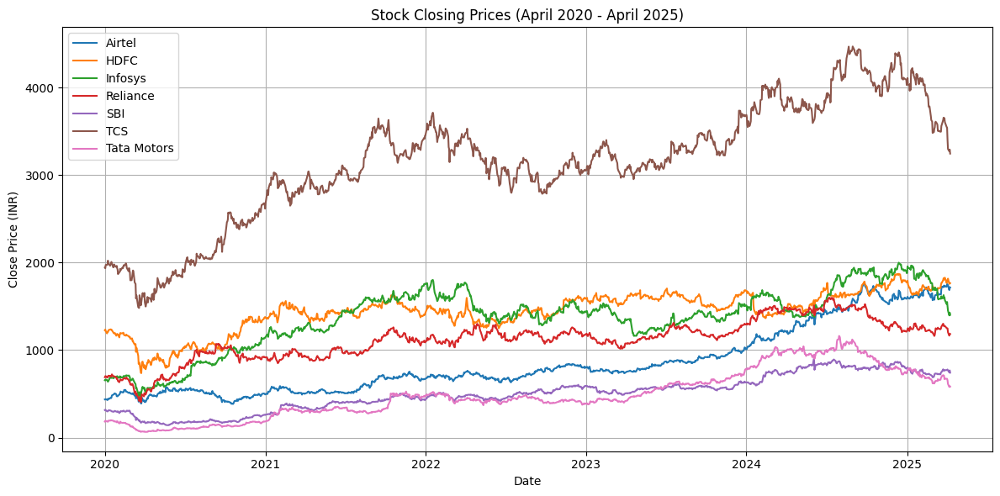

In [7]:
largest_comp_pivot = largest_comp.pivot(columns='Name', values='close')

plt.figure(figsize=(12, 6))
for company in largest_comp_pivot.columns:
    plt.plot(largest_comp_pivot.index, largest_comp_pivot[company], label=company)
plt.title('Stock Closing Prices (April 2020 - April 2025)')
plt.xlabel('Date')
plt.ylabel('Close Price (INR)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### General Observations
* A noticeable dip is observed around early 2020 due to the **COVID-19 pandemic** impact.
* **TCS** consistently maintained the highest stock price across the period, peaking around ₹4500 in early 2025 before a sharp drop.
* **Airtel** and **Infosys** showed steady upward trends over the years, indicating strong long-term growth.
* **Tata Motors** and **SBI** started with relatively lower prices but showed notable upward momentum, especially post-2021.
* **HDFC** showed stable, moderate growth with relatively lower volatility.
* **2021–2023** was recovery phase and most companies exhibited strong recovery and consistent upward trends.
* In **early 2025**, several stocks (notably **TCS**, **Infosys**, and **Tata Motors**) experienced a **sharp decline**, possibly due to **Trump tarrifs** and economic policy changes

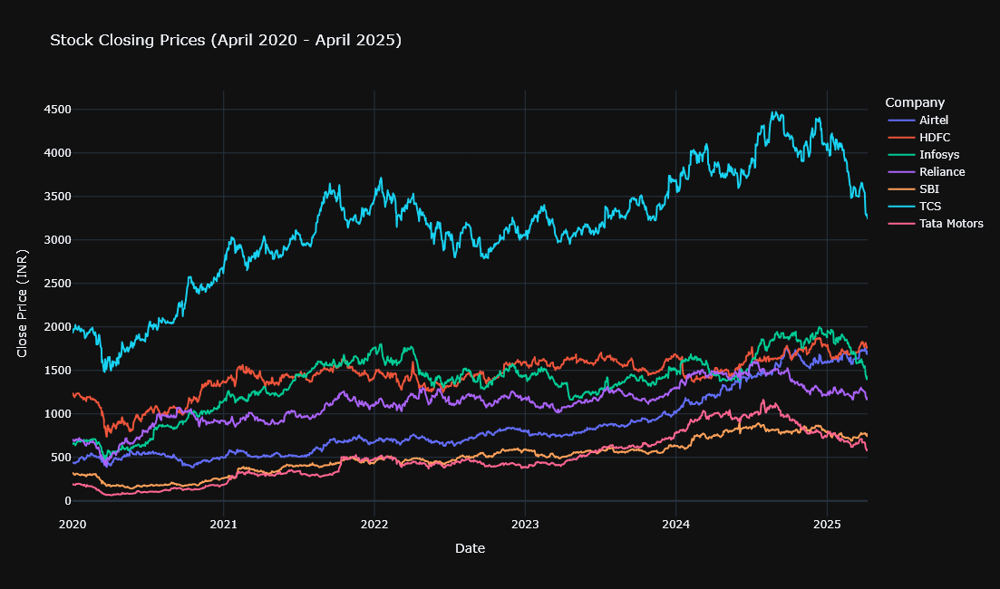

In [8]:
fig = px.line(largest_comp_pivot, 
              x=largest_comp_pivot.index, 
              y=largest_comp_pivot.columns,
              title='Stock Closing Prices (April 2020 - April 2025)')

fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Close Price (INR)',
     template='plotly_dark',  
    legend_title='Company',
    height=650
)

fig.show()

In [9]:
#### ADDED DAILY RETURN OF EACH STOCK
largest_comp['daily_return']=largest_comp.groupby('Name')['close'].pct_change()*100
largest_comp

,open,high,low,close,volume,Name,daily_return
date,,,,,,,
2020-01-01,693.978516,698.138733,688.263977,690.138306,14004468,Reliance,NaN
2020-01-02,691.235535,704.470520,691.235535,701.887512,17710316,Reliance,1.702442
2020-01-03,700.835999,704.790527,696.264343,702.733276,20984698,Reliance,0.120499
2020-01-06,694.892883,698.504456,684.835205,686.435303,24519177,Reliance,-2.319226
2020-01-07,694.435669,701.521790,691.921265,696.995850,16683622,Reliance,1.538462
...,...,...,...,...,...,...,...
2025-04-03,1534.650024,1534.650024,1485.050049,1496.500000,10459504,Infosys,-3.460957
2025-04-04,1460.500000,1472.000000,1448.000000,1451.650024,9590254,Infosys,-2.996991
2025-04-07,1352.000000,1405.900024,1307.000000,1396.750000,21715252,Infosys,-3.781905


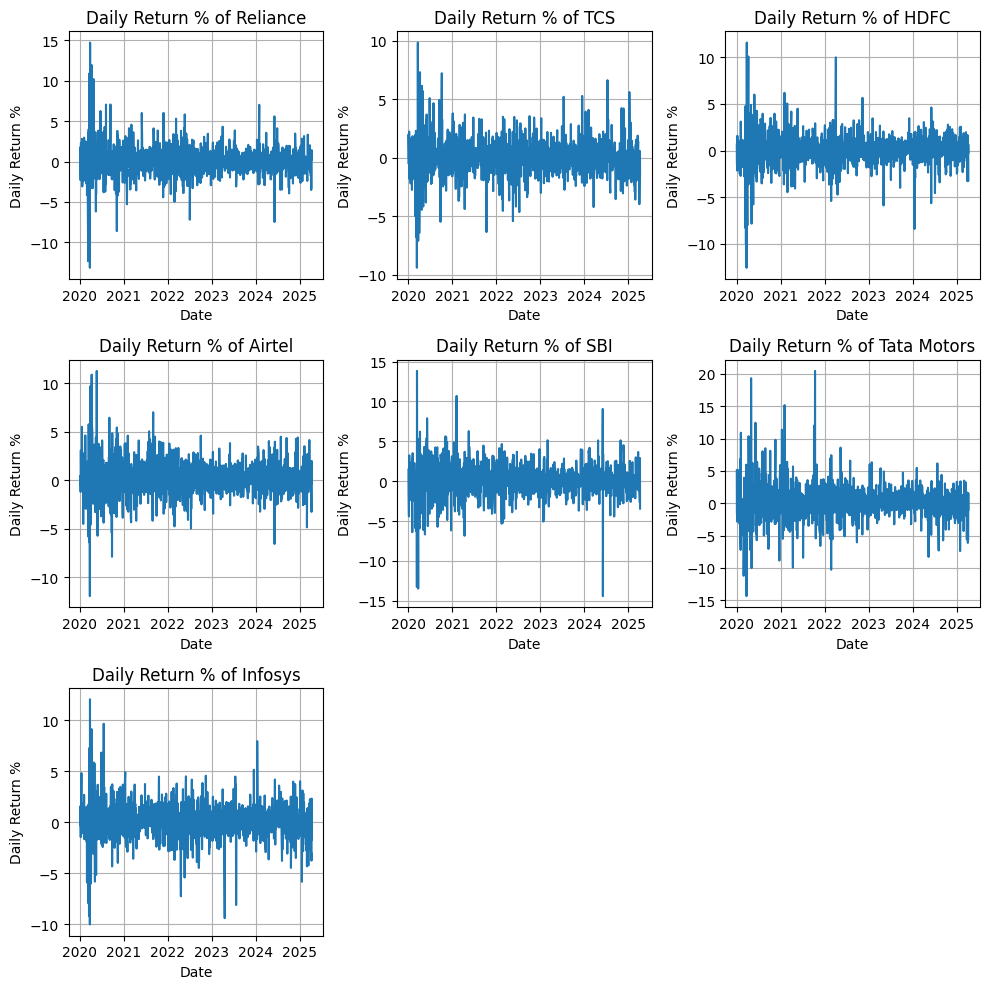

In [10]:
company_list = ['Reliance', 'TCS', 'HDFC', 'Airtel', 'SBI', 'Tata Motors', 'Infosys']
fig, axes = plt.subplots(3, 3, figsize=(10, 10))
axes = axes.flatten()

for index, company in enumerate(company_list):
    ax = axes[index]
    company_data = largest_comp[largest_comp['Name'] == company]

    # Use ax.plot instead of plt.plot
    ax.plot(company_data.index, company_data['daily_return'])
    ax.set_title(f'Daily Return % of {company}')
    ax.set_xlabel('Date')
    ax.set_ylabel('Daily Return %')
    ax.grid(True)

# Hide unused subplots (since you only have 7 companies and 9 subplots)
for i in range(len(company_list), len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()


The daily return percentage plots provide insight into the volatility and risk associated with each stock over the period from 2020 to 2025.

#### Key Observations:

* **High Volatility in Early 2020**  
  - All companies show large spikes and dips in daily returns during early 2020, corresponding to the COVID-19 market shock.

* **Overall Stability Over Time**  
  - Most companies exhibit reduced volatility after 2021, suggesting market stabilization post-pandemic and during the recov
ery phase.

* **Stock-Specific Insights**
  - Tata Motors shows the highest fluctuations among all, indicating higher risk and more speculative trading behavior.
  - Infosys and TCS display relatively stable daily returns with fewer extreme outliers, suggesting more consistent performance.
  - Airtel and SBI exhibit moderate fluctuations, with occasional sharp returns likely due to sectoral or policy impacts.
  - HDFC has one of the least volatile return profiles, which aligns with its nature as a traditionally conservative financial stock.
  - Reliance shows wide swings early on but stabilizes over time, likely driven by diversification into digital and retail sectors.


## VOLATILITY

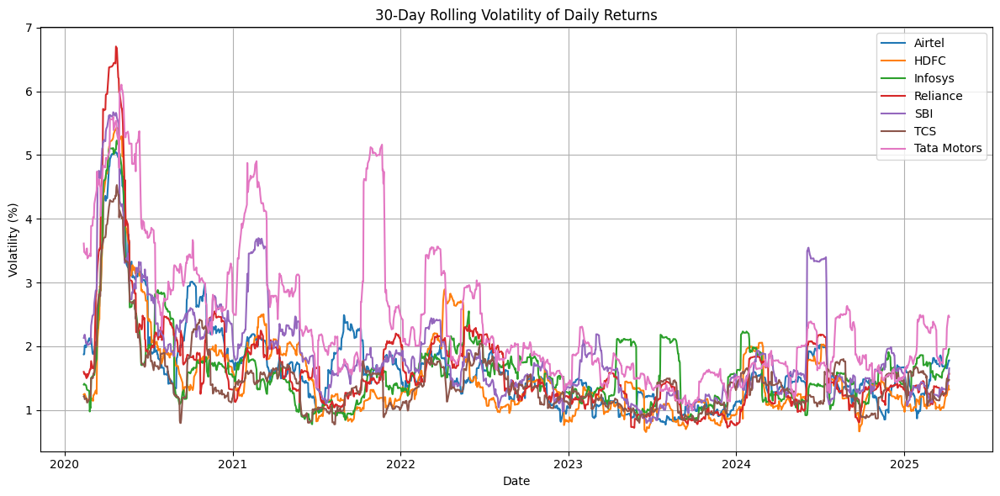

In [11]:
volatility = largest_comp.groupby('Name')['daily_return'].rolling(window=30).std().reset_index()
volatility = volatility.rename(columns={'daily_return': 'volatility'})  # Rename for clarity
# Plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=volatility, x='date', y='volatility', hue='Name')
plt.title('30-Day Rolling Volatility of Daily Returns')
plt.xlabel('Date')
plt.ylabel('Volatility (%)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### 30-Day Rolling Volatility Observations

- **Massive spike in volatility during early 2020** across all stocks due to the **COVID-19 market crash**, peaking around 6–7% for some companies.
- **Tata Motors** consistently had the **highest rolling volatility**, frequently spiking above 4–5%, highlighting its speculative and high-risk nature.
- **SBI** also showed noticeable spikes around mid-2021 and early 2023, suggesting sensitivity to specific market or policy events.
- **Infosys**, **TCS**, and **HDFC** maintained **lower and more stable volatility** levels after 2021, hovering around or below 2%, indicating more consistent performance.
- **HDFC** appears to have had the **lowest volatility overall**, aligning with its conservative investment profile.
- **Volatility converges post-2022**: By 2023–2024, most companies exhibited volatility in the 1–2% range, suggesting a stabilized market environment.
- **Mild uptick in volatility in early 2025** possibly linked to **policy shocks** like **Trump tariffs** or global macroeconomic uncertainty.


### MONTHLY AND YEARLY CLOSING PRICE ANALYSIS

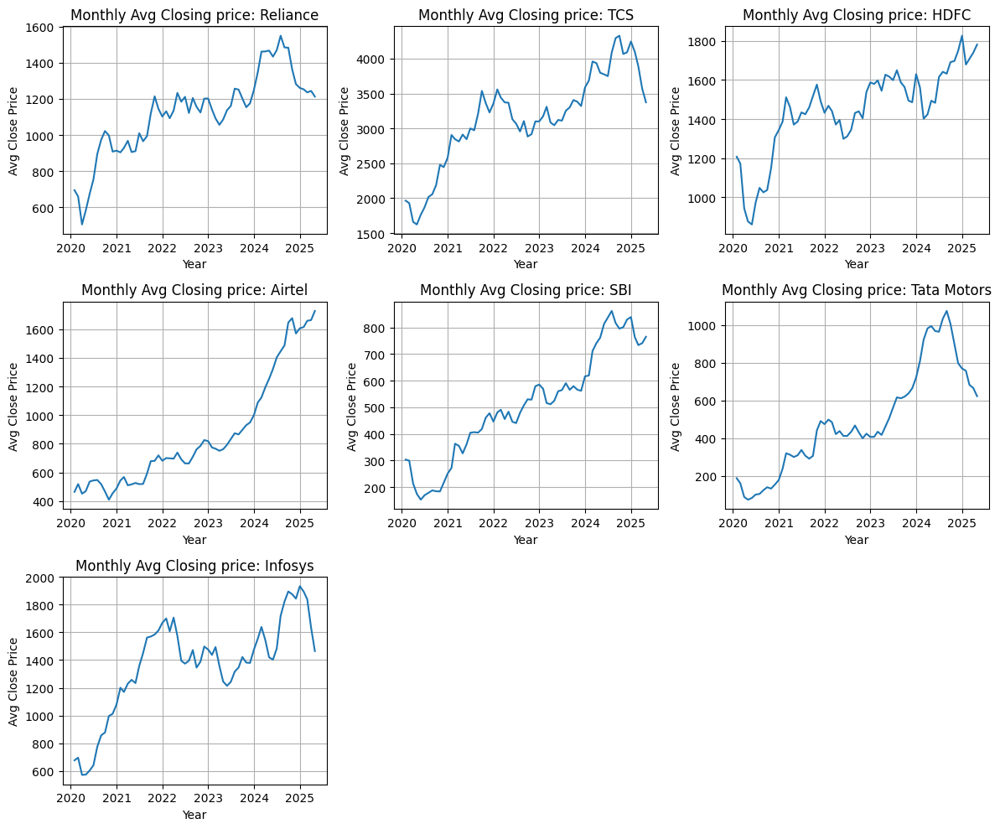

In [12]:
company_list = ['Reliance', 'TCS', 'HDFC', 'Airtel', 'SBI', 'Tata Motors', 'Infosys']
fig, axes = plt.subplots(3, 3, figsize=(12, 10))
axes = axes.flatten()

for index, company in enumerate(company_list):
    ax = axes[index]
    company_data = largest_comp[largest_comp['Name'] == company]  
    monthly_avg = company_data['close'].resample('M').mean().reset_index()

    ax.plot(monthly_avg['date'], monthly_avg['close'])
    ax.set_title(f'Monthly Avg Closing price: {company}')
    ax.set_xlabel('Year')
    ax.set_ylabel('Avg Close Price')
    ax.grid(True)

for i in range(len(company_list), len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()    

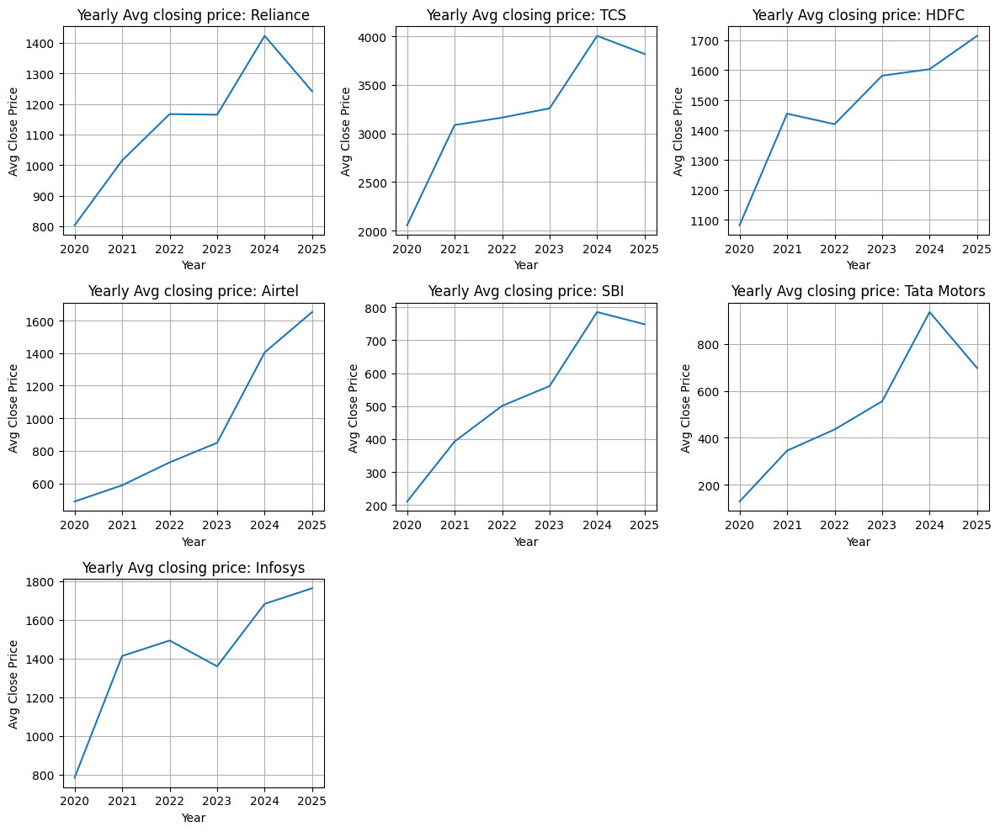

In [13]:
fig,axes=plt.subplots(3,3,figsize=(12,10))
axes=axes.flatten()

for index,company in enumerate(company_list):
    ax=axes[index]
    company_data=largest_comp[largest_comp['Name']==company]
    yearly_avg=company_data['close'].resample('Y').mean().reset_index()

    ax.plot(yearly_avg['date'].dt.year,yearly_avg['close'])
    ax.set_title(f'Yearly Avg closing price: {company}')
    ax.set_xlabel('Year')
    ax.set_ylabel('Avg Close Price')
    ax.grid(True)

for i in range(len(company_list), len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()       

## Stock Closing Prices Analysis (April 2020 - April 2025)

- **TCS**: Maintained a strong and consistent upward trend, peaking in 2024 (₹4000) before a slight dip in 2025, suggesting potential market saturation or profit booking.
- **Infosys**: Showed a sharp rise post-2020, with minor fluctuations during 2022–2023 and a strong recovery into 2025 (₹1770), reflecting resilience in the IT sector.
- **Airtel**: Witnessed a dramatic uptrend from 2023 onward, with average closing prices doubling by 2025 (₹1650), possibly driven by increased digital demand or 5G adoption.
- **Reliance**: Demonstrated steady growth from 2020 to 2024, reaching ₹1400+, followed by a mild dip in 2025, indicating a correction phase.
- **HDFC**: Exhibited the most stable and linear growth pattern, moving from ₹1100 in 2020 to over ₹1700 by 2025, consistent with its strong fundamentals and defensive nature.
- **SBI**: Showed reliable performance, with prices increasing to ₹780 by 2024, then slightly declining in 2025 — a pattern often observed in PSU banking stocks reacting to policy changes.
- **Tata Motors**: Displayed aggressive and volatile movement, rising sharply until 2024 (₹900) and then dropping in 2025 (₹700), indicating cyclical behavior and higher risk.

## COORELATION

In [14]:
largest_comp_pivot.corr()

Name,Airtel,HDFC,Infosys,Reliance,SBI,TCS,Tata Motors
Name,,,,,,,
Airtel,1.000000,0.693612,0.698265,0.750829,0.905505,0.804365,0.869641
HDFC,0.693612,1.000000,0.824528,0.721980,0.828218,0.845689,0.716473
Infosys,0.698265,0.824528,1.000000,0.800476,0.804128,0.942873,0.745574
Reliance,0.750829,0.721980,0.800476,1.000000,0.870822,0.889904,0.898590
SBI,0.905505,0.828218,0.804128,0.870822,1.000000,0.902600,0.945792
TCS,0.804365,0.845689,0.942873,0.889904,0.902600,1.000000,0.893982
Tata Motors,0.869641,0.716473,0.745574,0.898590,0.945792,0.893982,1.000000


Text(0.5, 1.0, 'Correlation of Closing Price')

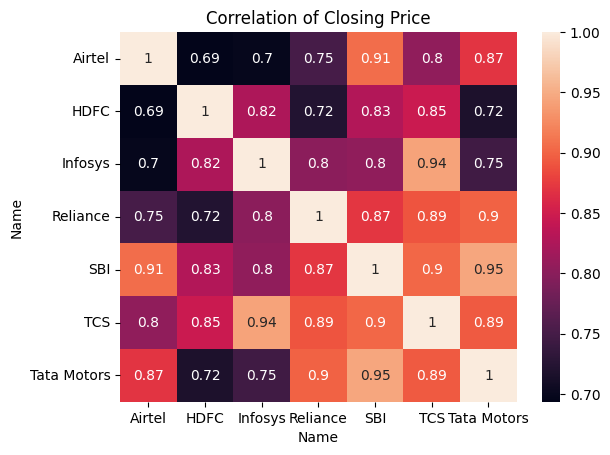

In [15]:
sns.heatmap(largest_comp_pivot.corr(), annot=True)
plt.title('Correlation of Closing Price')

### Observations from Correlation Heatmap

- Tata Motors and SBI have the highest correlation (0.95), indicating strong price movement similarity.
- Infosys and TCS are highly correlated (0.94), reflecting similar trends in the IT sector.
- Airtel and HDFC show the lowest correlation (0.69), suggesting less co-movement in their stock prices.
- Reliance shows strong correlation with most stocks, especially with Tata Motors (0.90) and TCS (0.89).
- Overall, most companies show moderate to high correlation, implying interconnected market movements.

## PORTFOLIO PERFORMANCE

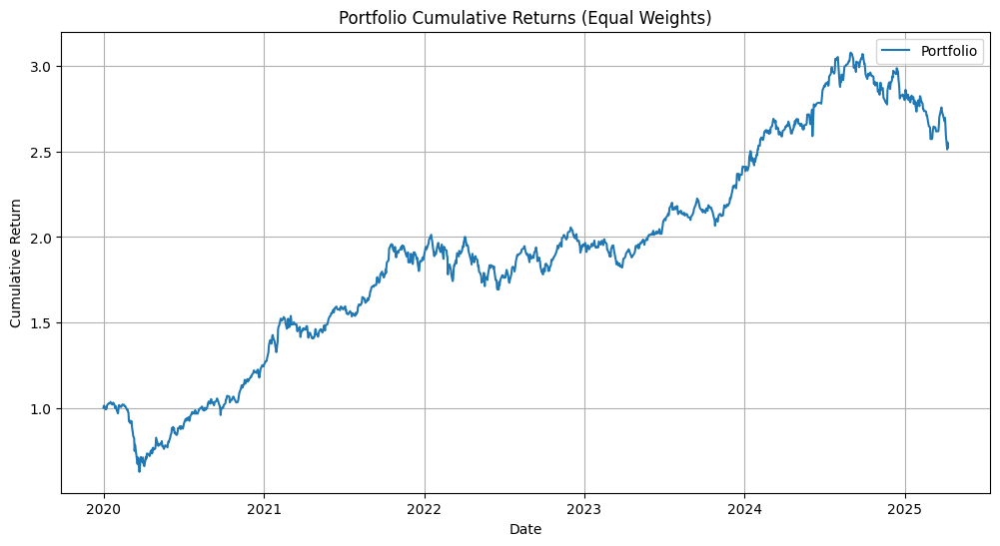

Portfolio Metrics:
Annualized Return: 20.03%
Volatility: 20.74%
Sharpe Ratio: 0.97


In [16]:
weights = [1/len(company_list)] * len(company_list)
portfolio_returns = (largest_comp_pivot.pct_change() * weights).sum(axis=1) * 100
cumulative_returns = (1 + portfolio_returns / 100).cumprod()
plt.figure(figsize=(12, 6))
plt.plot(cumulative_returns, label='Portfolio')
plt.title('Portfolio Cumulative Returns (Equal Weights)')
plt.xlabel('Date')
plt.ylabel('Cumulative Return')
plt.legend()
plt.grid(True)
plt.show()
# Sharpe Ratio
annualized_return = portfolio_returns.mean() * 252
annualized_volatility = portfolio_returns.std() * np.sqrt(252)
sharpe_ratio = annualized_return / annualized_volatility
print(f'Portfolio Metrics:\nAnnualized Return: {annualized_return:.2f}%\nVolatility: {annualized_volatility:.2f}%\nSharpe Ratio: {sharpe_ratio:.2f}')

### Performance Insights

- The portfolio achieved an **annualized return of 20.03%**, indicating strong performance over the period.
- **Volatility was 20.74%**, showing a moderate level of risk in the portfolent.
- The cumulative return trend shows consistent growth with some corrections, especially noticeable in early 2025.
- Equal-weighting the portfolio led to steady performance across different market conditions.


## PERFORMANCE COMPARISON WITH NIFTY

[*********************100%***********************]  1 of 1 completed


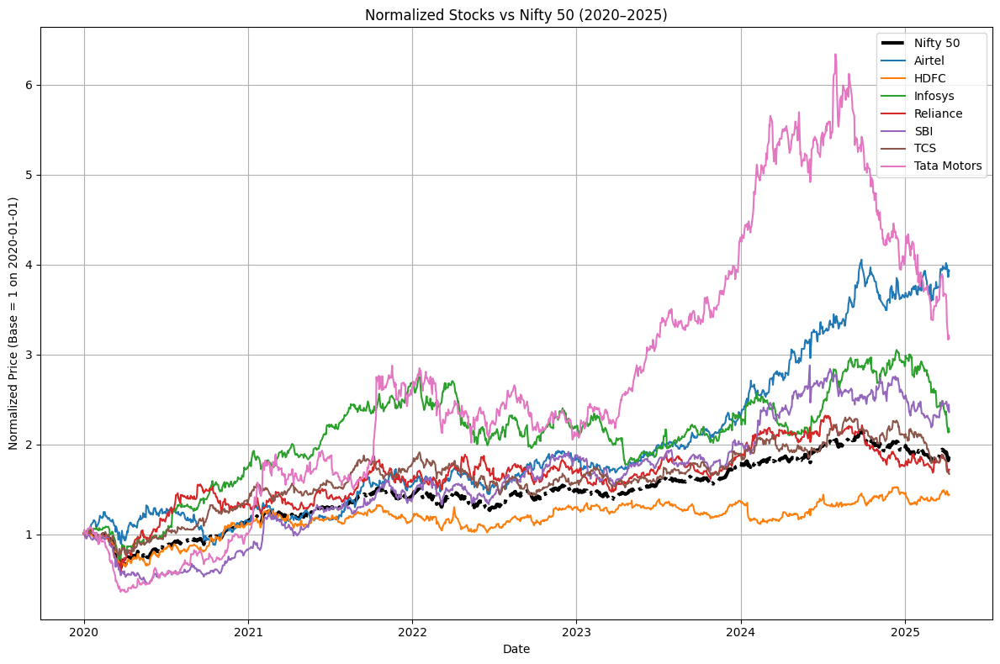

In [17]:
nifty = yf.download('^NSEI', start='2020-01-01', end='2025-04-10', auto_adjust=True)['Close']

nifty_normalized = nifty / nifty.iloc[0]
normalized_pivot = largest_comp_pivot / largest_comp_pivot.iloc[0]

plt.figure(figsize=(12, 8))
plt.plot(nifty_normalized.index, nifty_normalized, label='Nifty 50', color='black', linestyle='dashdot', linewidth=3)
for company in normalized_pivot.columns:
    plt.plot(normalized_pivot.index, normalized_pivot[company], label=company)
plt.title('Normalized Stocks vs Nifty 50 (2020–2025)')
plt.xlabel('Date')
plt.ylabel('Normalized Price (Base = 1 on 2020-01-01)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### Performance Comparison with Nifty 50 (2020–2025)

This chart compares the normalized prices of selected companies with the Nifty 50 index, using a common base of 1 on 2020-01-01. It helps visualize relative performance over time.

#### Key Observations:

- **Tata Motors** delivered the highest return overall, with a strong rally from 2022 to late 2024, before facing a sharp correction in 2025.
- **Airtel** showed consistent and impressive growth, especially in the later years, outperforming the Nifty 50 by a noticeable margin.
- **Infosys** performed well, staying ahead of the Nifty 50 for most of the period, despite some fluctuations.
- **Reliance** displayed steady but moderate growth, generally staying close to the index. It lagged behind more aggressive performers like Tata Motors and Airtel.
- **SBI** had phases of strong growth, particularly in 2021 and early 2023, but showed some volatility afterward.
- **TCS** tracked a similar pattern to Infosys and SBI, delivering decent returns but not drastically outperforming the index.
- **HDFC** was the most stable but underwhelming performer, remaining below the Nifty 50 line throughout the period.
- The **Nifty 50** index (black dash-dot line) offered steady benchmark returns, helping evaluate stock-specific outperformance.

> This comparison highlights how specific stock choices can lead to significantly higher or lower returns compared to the market index.
e differences.


## FORECASTING

In [18]:
results = {'Company': [], 'MAE (INR)': [], 'RMSE (INR)': [], 'Last Price (INR)': [], 'Relative RMSE (%)': []}
companies = ['Reliance', 'TCS', 'HDFC', 'Airtel', 'SBI', 'Tata Motors', 'Infosys']

largest_comp_reset = largest_comp.reset_index()

for company in companies:
    df_prophet = largest_comp_reset[largest_comp_reset['Name'] == company][['date', 'close']].reset_index(drop=True)
    df_prophet.columns = ['ds', 'y']
    df_prophet = df_prophet.sort_values('ds')
    
    train = df_prophet[:-30]
    test = df_prophet[-30:]

    if company in ['TCS', 'SBI', 'Tata Motors', 'Infosys']:
        model = Prophet(
            yearly_seasonality=True,
            weekly_seasonality=True,
            daily_seasonality=False,
            changepoint_prior_scale=0.5,   # more flexibility
            seasonality_prior_scale=1.0    # allow stronger seasonal fit
        )
    else:
        model = Prophet(
            yearly_seasonality=True,
            weekly_seasonality=True,
            daily_seasonality=False,
            changepoint_prior_scale=0.05   # default conservative setting
        )

    model.fit(train)

    future = model.make_future_dataframe(periods=30)
    forecast_test = model.predict(future)
    predicted = forecast_test.tail(30)['yhat']
    actual = test['y']
    
    mae = (predicted - actual).abs().mean()
    
    rmse = np.sqrt(((predicted - actual) ** 2).mean())
    
    last_price = actual.iloc[-1]
    
    relative_rmse = (rmse / last_price) * 100
    
    results['Company'].append(company)
    results['MAE (INR)'].append(mae)
    results['RMSE (INR)'].append(rmse)
    results['Last Price (INR)'].append(last_price)
    results['Relative RMSE (%)'].append(relative_rmse)

results_df = pd.DataFrame(results)

print("\nForecast Accuracy:")
results_df.round(2)

16:34:56 - cmdstanpy - INFO - Chain [1] start processing
16:34:56 - cmdstanpy - INFO - Chain [1] done processing
16:34:58 - cmdstanpy - INFO - Chain [1] start processing
16:34:58 - cmdstanpy - INFO - Chain [1] done processing
16:35:00 - cmdstanpy - INFO - Chain [1] start processing
16:35:01 - cmdstanpy - INFO - Chain [1] done processing
16:35:03 - cmdstanpy - INFO - Chain [1] start processing
16:35:03 - cmdstanpy - INFO - Chain [1] done processing
16:35:05 - cmdstanpy - INFO - Chain [1] start processing
16:35:06 - cmdstanpy - INFO - Chain [1] done processing
16:35:08 - cmdstanpy - INFO - Chain [1] start processing
16:35:09 - cmdstanpy - INFO - Chain [1] done processing
16:35:10 - cmdstanpy - INFO - Chain [1] start processing
16:35:11 - cmdstanpy - INFO - Chain [1] done processing



Forecast Accuracy:


,Company,MAE (INR),RMSE (INR),Last Price (INR),Relative RMSE (%)
0,Reliance,46.74,53.76,1185.35,4.54
1,TCS,355.17,370.30,3246.60,11.41
2,HDFC,62.35,70.04,1765.00,3.97
3,Airtel,42.34,51.15,1715.55,2.98
4,SBI,24.76,28.78,742.20,3.88
5,Tata Motors,53.03,63.22,582.90,10.85
6,Infosys,185.50,200.68,1403.70,14.30


### Forecast Accuracy Summary

**Findings:**

- Airtel had the most accurate forecast with the lowest relative RMSE of 2.98%, indicating high reliability in its predictions.
- Infosys and TCS had the highest relative RMSEs of 14.30% and 11.41% respectively, suggesting more volatile or harder-to-predict trends.
- Reliance, HDFC, and SBI showed consistent and moderate accuracy, with relative RMSE values under 5%.
- Most companies had a Mean Absolute Error (MAE) below ₹100, except for TCS and Infosys, which had higher absolute deviations.
- The Prophet model overall performed well for short-term forecasting, but accuracy varied across companies.

**Possible Reasons:**

- Stocks like Infosys and TCS might be more sensitive to global events (e.g., US tech sector, exchange rates), increasing unpredictability.
- Airtel and SBI may have more stable business models or less volatile stock behavior, aiding better forecasts.
- The model’s default seasonality and changepoint settings might have aligned better with companies showing smoother trends.
- Companies with fewer sharp fluctuations or irregular spikes generally result in lower forecasting errors.
- External factors (earnings surprises, policy changes, or geopolitical factors) might have impacted some stocks me than others.
terns.


## FINAL RESULTS

In [19]:
largest_comp = largest_comp.reset_index()

company_dfs = []

companies = ['Reliance', 'TCS', 'HDFC', 'Airtel', 'SBI', 'Tata Motors', 'Infosys']

for company in companies:
    df_prophet = largest_comp[largest_comp['Name'] == company][['date', 'close']].reset_index(drop=True)
    df_prophet.columns = ['ds', 'y']
    df_prophet = df_prophet.sort_values('ds')
    
    if company in ['TCS', 'SBI', 'Tata Motors', 'Infosys']:
        model = Prophet(
            yearly_seasonality=True,
            weekly_seasonality=True,
            daily_seasonality=False,
            changepoint_prior_scale=0.5,
            seasonality_prior_scale=1.0
        )
    else:
        model = Prophet(
            yearly_seasonality=True,
            weekly_seasonality=True,
            daily_seasonality=False,
            changepoint_prior_scale=0.05
        )

    model.fit(df_prophet)  

    future = model.make_future_dataframe(periods=30)
    forecast_test = model.predict(future)
    
    future_predictions = forecast_test[forecast_test['ds'] > df_prophet['ds'].max()][['ds', 'yhat']]
    future_predictions['Name'] = company
    future_predictions = future_predictions.rename(columns={'ds': 'date', 'yhat': 'close'})
    
    future_predictions_full = pd.DataFrame({
        'date': future_predictions['date'],
        'open': np.nan,
        'high': np.nan,
        'low': np.nan,
        'close': future_predictions['close'],
        'volume': np.nan,
        'Name': future_predictions['Name']
    })

    company_df = pd.concat([largest_comp[largest_comp['Name'] == company], future_predictions_full], ignore_index=True)
    company_df = company_df.sort_values('date')  # Sort by date within the company
    company_dfs.append(company_df)

largest_comp_extended = pd.concat(company_dfs, ignore_index=True)
print("\nExtended DataFrame with Predicted Prices:")
largest_comp_extended.round(2)

16:35:13 - cmdstanpy - INFO - Chain [1] start processing
16:35:13 - cmdstanpy - INFO - Chain [1] done processing
16:35:15 - cmdstanpy - INFO - Chain [1] start processing
16:35:16 - cmdstanpy - INFO - Chain [1] done processing
16:35:18 - cmdstanpy - INFO - Chain [1] start processing
16:35:18 - cmdstanpy - INFO - Chain [1] done processing
16:35:20 - cmdstanpy - INFO - Chain [1] start processing
16:35:20 - cmdstanpy - INFO - Chain [1] done processing
16:35:22 - cmdstanpy - INFO - Chain [1] start processing
16:35:23 - cmdstanpy - INFO - Chain [1] done processing
16:35:24 - cmdstanpy - INFO - Chain [1] start processing
16:35:25 - cmdstanpy - INFO - Chain [1] done processing
16:35:27 - cmdstanpy - INFO - Chain [1] start processing
16:35:28 - cmdstanpy - INFO - Chain [1] done processing



Extended DataFrame with Predicted Prices:


,date,open,high,low,close,volume,Name,daily_return
0,2020-01-01,693.98,698.14,688.26,690.14,14004468.0,Reliance,NaN
1,2020-01-02,691.24,704.47,691.24,701.89,17710316.0,Reliance,1.70
2,2020-01-03,700.84,704.79,696.26,702.73,20984698.0,Reliance,0.12
3,2020-01-06,694.89,698.50,684.84,686.44,24519177.0,Reliance,-2.32
4,2020-01-07,694.44,701.52,691.92,697.00,16683622.0,Reliance,1.54
...,...,...,...,...,...,...,...,...
9354,2025-05-05,NaN,NaN,NaN,1441.51,NaN,Infosys,NaN
9355,2025-05-06,NaN,NaN,NaN,1442.00,NaN,Infosys,NaN
9356,2025-05-07,NaN,NaN,NaN,1442.86,NaN,Infosys,NaN
9357,2025-05-08,NaN,NaN,NaN,1443.24,NaN,Infosys,NaN


In [20]:
final_df=largest_comp_extended[['date','close']]

In [22]:
final_df.to_csv('largest_comp_extended.csv', index=False)

In [25]:
## Saving the Final DataFrame (Original + Predicted Prices)
final_df

,date,close
0,2020-01-01,690.138306
1,2020-01-02,701.887512
2,2020-01-03,702.733276
3,2020-01-06,686.435303
4,2020-01-07,696.995850
...,...,...
9354,2025-05-05,1441.512800
9355,2025-05-06,1441.996974
9356,2025-05-07,1442.860269
9357,2025-05-08,1443.236152
